# Estimating Critical Temperature of Superconductors

Importing libraries

In [1]:
import pandas as pd
import sklearn
import matplotlib as mp
import numpy as np
from numpy import array
from sklearn.model_selection import train_test_split
from pandas.plotting import scatter_matrix
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy.stats import boxcox
import seaborn as sns
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import validation_curve
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import StackingRegressor
from sklearn.model_selection import cross_validate, cross_val_predict
from sklearn.linear_model import RidgeCV
import time
import joblib

import os
from pathlib import Path
os.chdir(Path().cwd().parent)
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

sns.set_style('whitegrid')
sns.set_palette(sns.color_palette('muted'))
sns.set_context(sns.plotting_context('notebook'))
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')


# Sections of the Report


(introduction, method, evaluation, conclusion, bibliography, etc.) 
1. loading and cleaning the data,
2. analysing and visualising the data,
3. preparing the inputs and choosing a suitable subset of features,
4. selecting and training a regression model,
5. evaluating the performance of the model, and
6. a critical discussion of the results and your approach.

# Research questions/ Objectives

1. Which features strongly correlate with the critical temperature required to attain superconductivity?
2. Presence of which elements in the compound generally tends to give the highest critical temperatures for superconductivity?
3. What is the most accurate (or least erroneous) model we can build to predict the critical temperature required for superconductivity for a given compound?

# 1. Introduction

In this study, we take an entirely data-driven approach to create a statistical model that predicts T c based on its chemical formula. The superconductor data comes from the Superconducting Material Database maintained by Japan’s National Institute for Materials Science (NIMS) at http://supercon.nims.go.jp/index_en.html. After some data preprocessing, 21,263 superconductors are used.



# 2. Method

## 2.1 Loading and Cleaning the data 


For cleaaning the data 

In [2]:
data = pd.read_csv('train.csv')
datamol = pd.read_csv('unique_m.csv')
# explore the data set for any null values



data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21263 entries, 0 to 21262
Data columns (total 82 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   number_of_elements               21263 non-null  int64  
 1   mean_atomic_mass                 21263 non-null  float64
 2   wtd_mean_atomic_mass             21263 non-null  float64
 3   gmean_atomic_mass                21263 non-null  float64
 4   wtd_gmean_atomic_mass            21263 non-null  float64
 5   entropy_atomic_mass              21263 non-null  float64
 6   wtd_entropy_atomic_mass          21263 non-null  float64
 7   range_atomic_mass                21263 non-null  float64
 8   wtd_range_atomic_mass            21263 non-null  float64
 9   std_atomic_mass                  21263 non-null  float64
 10  wtd_std_atomic_mass              21263 non-null  float64
 11  mean_fie                         21263 non-null  float64
 12  wtd_mean_fie      

In [3]:
data.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.0
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.0
2,4,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.0
3,4,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.0
4,4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.0


In [4]:
datamol.head()

,H,He,Li,Be,B,C,N,O,F,Ne,...,Au,Hg,Tl,Pb,Bi,Po,At,Rn,critical_temp,material
0,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,29.0,Ba0.2La1.8Cu1O4
1,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,26.0,Ba0.1La1.9Ag0.1Cu0.9O4
2,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,19.0,Ba0.1La1.9Cu1O4
3,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,22.0,Ba0.15La1.85Cu1O4
4,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,23.0,Ba0.3La1.7Cu1O4


Upon looking at that dataset, we can see that each column has an equal amount of 21263 non-null values, indicating that there are no instances of missing data. Now let's check for any duplicate entries!

In [5]:
# remove duplicate rows
duplicate_rows = data[data.duplicated()]
print (len(duplicate_rows))
clean_data = data.drop_duplicates(keep=False,inplace=False)
c = clean_data

# Change the data types
c['range_Valence'] = c.range_Valence.astype(float)
c['number_of_elements'] = c.number_of_elements.astype(float)
c['range_atomic_radius'] = c.range_atomic_radius .astype(float)

c.info()

66
<class 'pandas.core.frame.DataFrame'>
Int64Index: 21132 entries, 0 to 21262
Data columns (total 82 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   number_of_elements               21132 non-null  float64
 1   mean_atomic_mass                 21132 non-null  float64
 2   wtd_mean_atomic_mass             21132 non-null  float64
 3   gmean_atomic_mass                21132 non-null  float64
 4   wtd_gmean_atomic_mass            21132 non-null  float64
 5   entropy_atomic_mass              21132 non-null  float64
 6   wtd_entropy_atomic_mass          21132 non-null  float64
 7   range_atomic_mass                21132 non-null  float64
 8   wtd_range_atomic_mass            21132 non-null  float64
 9   std_atomic_mass                  21132 non-null  float64
 10  wtd_std_atomic_mass              21132 non-null  float64
 11  mean_fie                         21132 non-null  float64
 12  wtd_mean_fie   

<ipython-input-5-c761d123ea8f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c['range_Valence'] = c.range_Valence.astype(float)
<ipython-input-5-c761d123ea8f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c['number_of_elements'] = c.number_of_elements.astype(float)
<ipython-input-5-c761d123ea8f>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pyd

## 2.2 Creating a Test Set

In [6]:
train_set, test_set = train_test_split(c, test_size=0.2)
# train_set.info()

From above we can see that the some of the numerical inputs have very different scales. i.e number of elements ranges from 1 to 9 whilst, mean atomic mass ranges from 7 to 210. Worthy to be aware of the scales as large differences could impact performance

Getting a feel of the dataset using the histogram. 

In [7]:
#transform the data to have a more gaussian distribution
c.describe()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
count,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000,...,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000,21132.000000
mean,4.125308,87.529401,72.901265,71.214916,58.409270,1.167941,1.066308,115.898985,33.182168,44.479526,...,3.144623,3.048562,3.047121,1.298336,1.055092,2.044104,1.478831,0.840051,0.674360,34.567391
std,1.437285,29.609413,33.430323,30.950303,36.578462,0.364494,0.401024,54.544766,26.964290,20.004807,...,1.188490,1.042980,1.171607,0.392521,0.379960,1.244112,0.976937,0.485319,0.456490,34.297978
min,1.000000,6.941000,6.423452,5.320573,1.960849,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000210
25%,3.000000,72.620646,52.145150,58.041225,35.242670,0.977795,0.784634,78.899680,16.791611,32.932106,...,2.115830,2.245649,2.089968,1.060857,0.783267,1.000000,0.921201,0.451754,0.306191,5.400000
50%,4.000000,84.918887,60.659736,66.361592,39.834988,1.199541,1.150181,122.906070,26.543060,45.135200,...,2.600000,2.615321,2.420740,1.368922,1.169950,2.000000,1.062573,0.800000,0.500000,20.000000
75%,5.000000,100.351275,85.902954,77.821240,72.865930,1.444537,1.361055,155.006000,38.302286,59.571484,...,4.000000,3.662842,3.890519,1.589027,1.332179,3.000000,1.904762,1.200000,1.021023,63.000000
max,9.000000,208.980400,208.980400,208.980400,208.980400,1.983797,1.958203,207.972460,205.589910,101.019700,...,7.000000,7.000000,7.000000,2.141963,1.949739,6.000000,6.992200,3.000000,3.000000,185.000000


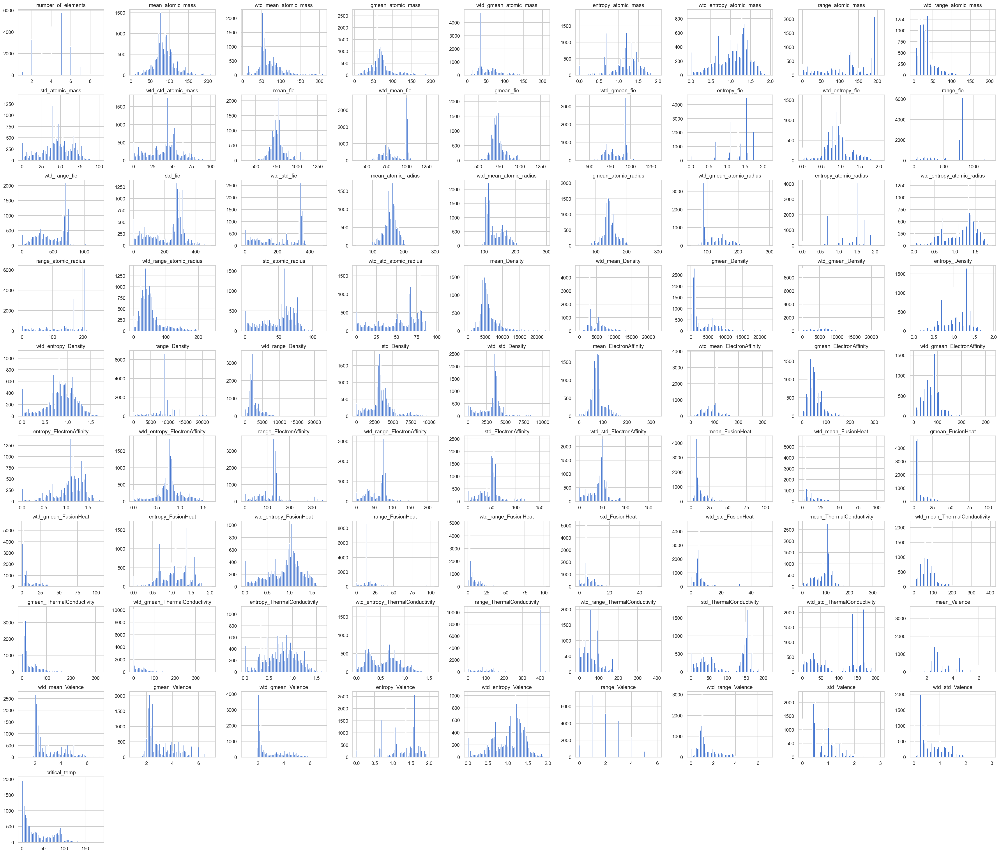

In [8]:
%matplotlib inline 
import matplotlib.pyplot as plt
data.hist(bins=100,figsize=(40,35))
plt.show()

In [9]:
plt.figure(figsize=(110,108))
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True)

<AxesSubplot:>

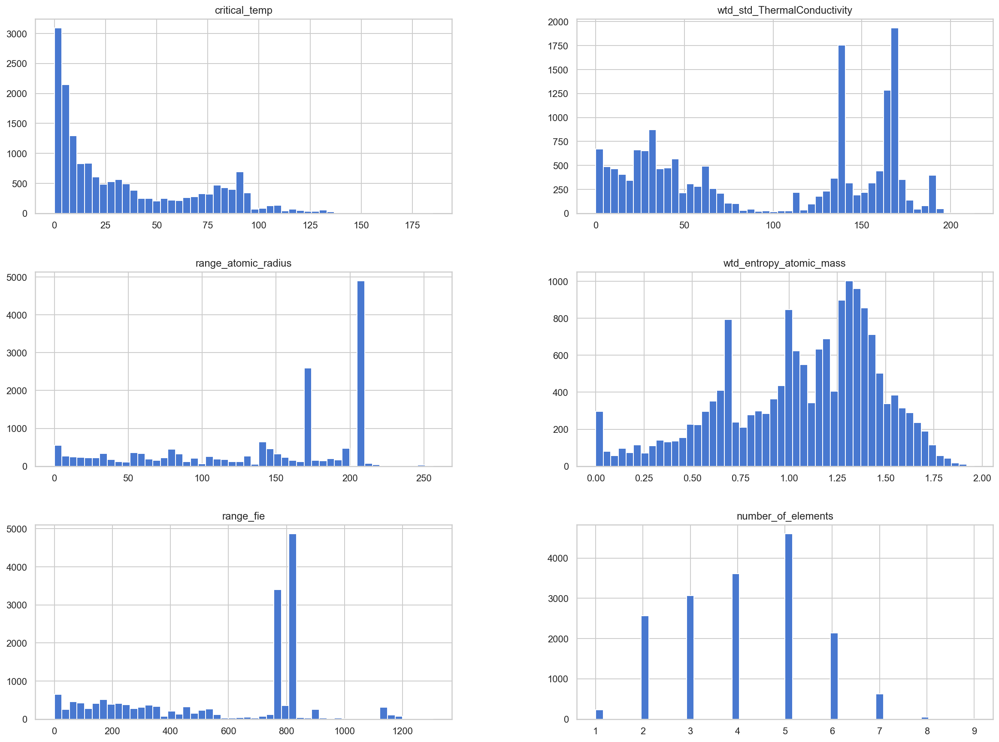

In [10]:
# thermal conductivity, atomic radius, valence, electron affinity, atomic mass
# Figure 1 in report. Plot showing the temperatures
top = ["critical_temp","wtd_std_ThermalConductivity","range_atomic_radius", "wtd_entropy_atomic_mass", "range_fie", "number_of_elements" ]
%matplotlib inline
import matplotlib.pyplot as plt 
train_set[top].hist(bins=50, figsize=(20,15)) 
plt.show()



## 2.3.1 Visualising and Analysing the Training Set (TODO)

To look for correlations, it would be worthy to plot scatterplots to see the relationship between the features and the critical temperature

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='mean_atomic_mass', ylabel='critical_temp'>

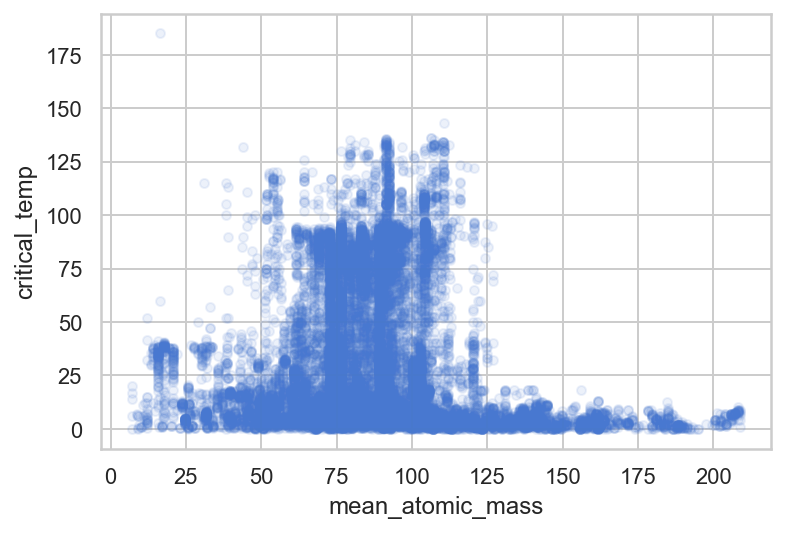

In [11]:
train_set.plot(kind='scatter', x='mean_atomic_mass', y='critical_temp', alpha=0.1)

No lets look at house this data relates to thermoconductivity

## 2.3.2 Looking for correlations (Todo)

Since the dataset is not too large, we can easily compute the standard correlation
coefficient (also called Pearson’s r) between every pair of attributes using the corr() method:

In [12]:
corr = train_set.corr()



top_features = ["critical_temp","wtd_std_ThermalConductivity", "range_atomic_radius", "wtd_entropy_atomic_mass", 
               "range_fie", "number_of_elements", "entropy_Valence" ]

bot_feat = corr['critical_temp'].sort_values(ascending = True).head(10)
bot = bot_feat.index.values

Interestingly, it is evident the thermalconductivity, atomic radius, valence and number elements highly correlate with critical temperature. Given this inoformation, lets plot a scatter matrix to visualise these correlations or a correlation matrix

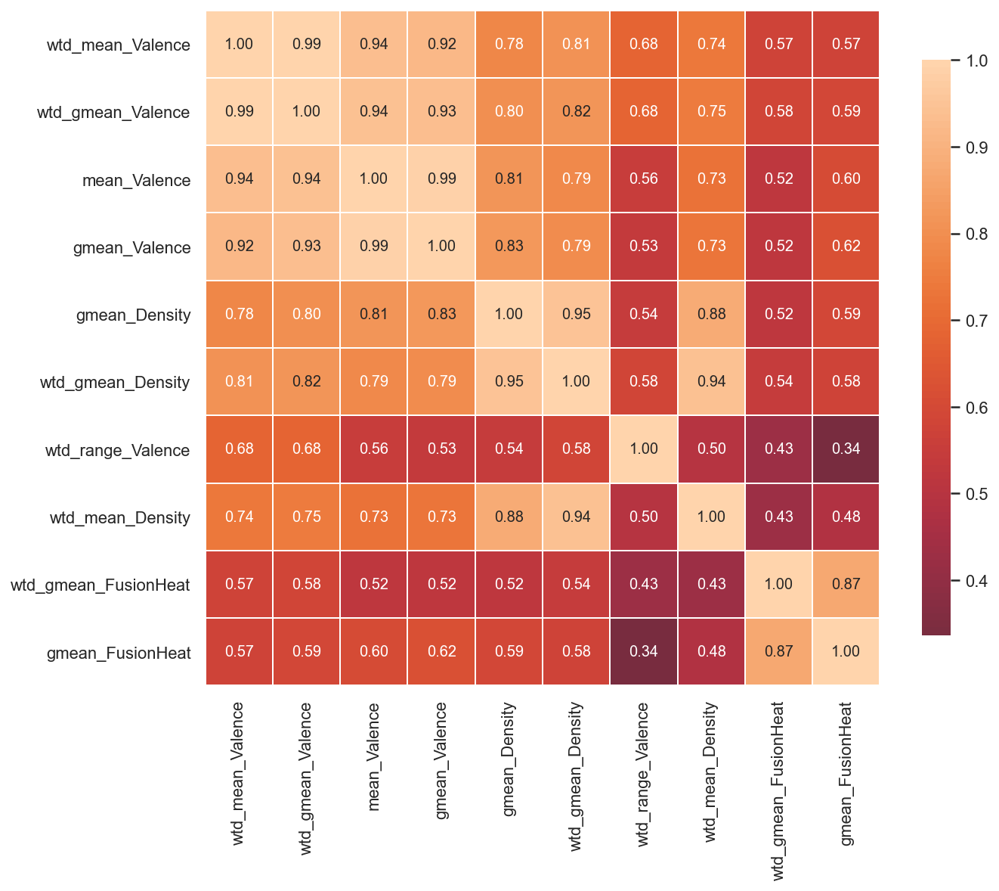

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16905 entries, 17639 to 14275
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   wtd_mean_Valence      16905 non-null  float64
 1   wtd_gmean_Valence     16905 non-null  float64
 2   mean_Valence          16905 non-null  float64
 3   gmean_Valence         16905 non-null  float64
 4   gmean_Density         16905 non-null  float64
 5   wtd_gmean_Density     16905 non-null  float64
 6   wtd_range_Valence     16905 non-null  float64
 7   wtd_mean_Density      16905 non-null  float64
 8   wtd_gmean_FusionHeat  16905 non-null  float64
 9   gmean_FusionHeat      16905 non-null  float64
dtypes: float64(10)
memory usage: 1.4 MB


In [13]:
most_corr = train_set[bot]


def correlation_heatmap(train):
    correlations = train.corr()

    fig, ax = plt.subplots(figsize=(10,10))
    sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f',
                square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .70})
    plt.show();
    
correlation_heatmap(most_corr)


most_corr.info()



In [14]:
top_features =["critical_temp","wtd_std_ThermalConductivity", "range_atomic_radius", "wtd_entropy_atomic_mass", 
               "range_fie", "number_of_elements", "entropy_Valence" ]
# scatter_matrix(train_set[top_features], figsize=(10,10))

As we can see from the figure above, the promising attribute to predict the critical temperature appears to be the wtd_std_ThermalConductivity, so let's zoom in on their correlation scatterplot 

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='wtd_std_ThermalConductivity', ylabel='critical_temp'>

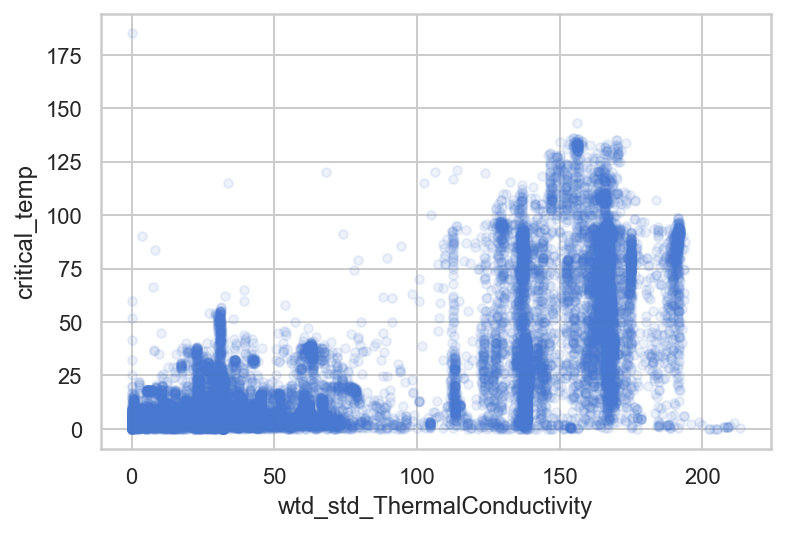

In [15]:
train_set.plot(kind="scatter", x="wtd_std_ThermalConductivity", y="critical_temp", alpha=0.1)

## 2.4 Selecting and Training The Model

The model that be used first is Linear Regression. This is because given the data set, we are trying to understanding the relationship between the 81 independant variables and the depedent variable - critical temperature. 

Linear Regression Performance:
RMSE = 17.656613338506254
R2 = 0.7352721918034106
Random Forest Performance:
RMSE = 19.819680822991227
R2 = 0.6664368522477221


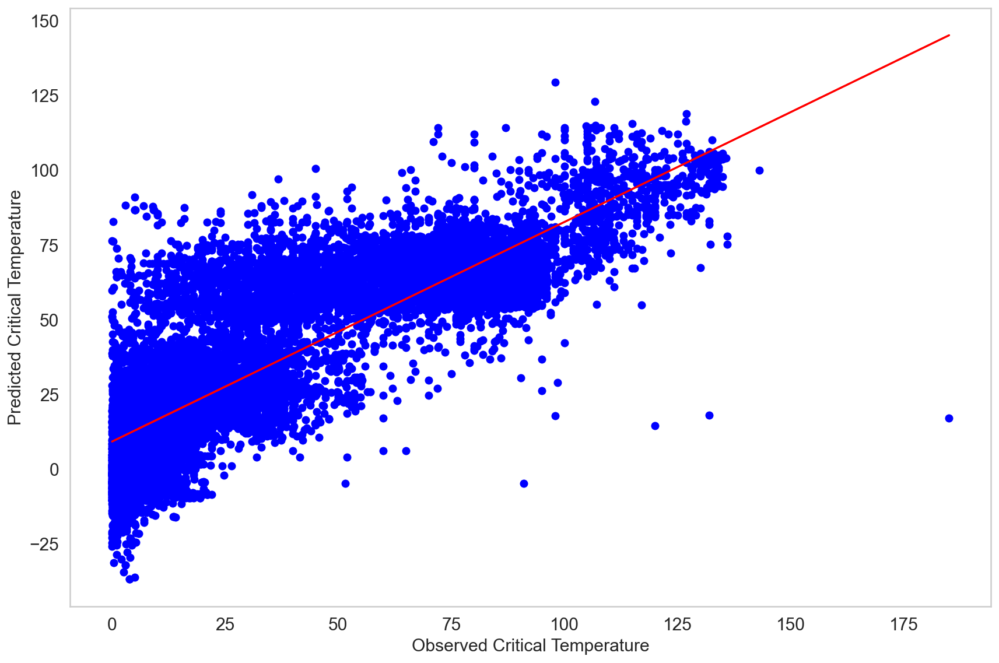

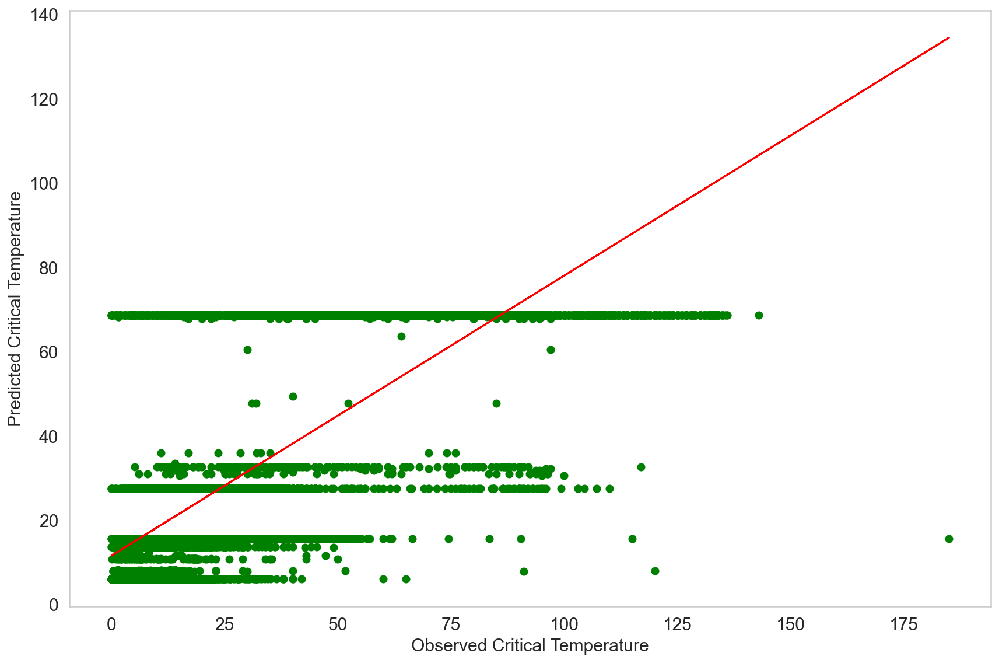

In [16]:
#Prepare the data for the model
X_train = train_set.iloc[:,0:80].to_numpy()
y_train = train_set.iloc[:,81].to_numpy()


def run_linreg_train(X,y):
    linreg = LinearRegression()
    linreg.fit(X,y)
    y_hat = linreg.predict(X)
    mse = mean_squared_error(y,y_hat)
    rmse = np.sqrt(mse)
    r2 = r2_score(y, y_hat)
    print("Linear Regression Performance:\nRMSE = {0}\nR2 = {1}".format(rmse,r2))
    return y_hat

def run_forest_train(X,y):
    regr = RandomForestRegressor(max_depth=2, random_state=0)
    regr.fit(X,y)
    y_hat = regr.predict(X)
    lin_mse = mean_squared_error(y,y_hat)
    lin_rmse = np.sqrt(lin_mse)
    r2 = r2_score(y, y_hat)
    print("Random Forest Performance:\nRMSE = {0}\nR2 = {1}".format(lin_rmse,r2))
    return y_hat
    


y_hat_lin = run_linreg_train(X_train,y_train)
y_hat_forest = run_forest_train(X_train,y_train)



def plotModel(y, y_hat,c):
    # Create a dictionary to pass to matplotlib
    # These settings make the plots readable on slides, feel free to change
    # This is an easy way to set many parameters at once
    fontsize = "15";
    params = {'figure.autolayout':True,
              'legend.fontsize': fontsize,
              'figure.figsize': (12, 8),
             'axes.labelsize': fontsize,
             'axes.titlesize': fontsize,
             'xtick.labelsize':fontsize,
             'ytick.labelsize':fontsize}
    plt.rcParams.update(params)
    
    # Create a new figure and an axes objects for the subplot
    # We only have one plot here, but it's helpful to be consistent
    fig, ax = plt.subplots()
    
    # Draw a scatter plot of the first column of x vs second column.
    ax.scatter(y,y_hat, color = c)
    ax.set_xlabel("Observed Critical Temperature")
    ax.set_ylabel("Predicted Critical Temperature")
    ax.grid(color='lightgray', linestyle='-', linewidth=1)
    ax.set_axisbelow(True)
    
    m, b = np.polyfit(y, y_hat, 1)
    ax.plot(y, m*y + b, color='red')

lin_color = 'blue'
for_color = 'green'
plotModel(y_train,y_hat_lin,lin_color)
plotModel(y_train,y_hat_forest,for_color)



    

### Evaluating on the test set



In [ ]:
final_model= joblib.load("final_model.pkl")
X_test = test_set.iloc[:,0:80].to_numpy()
y_test = test_set.iloc[:,81].to_numpy()

def run_final_model(X,y, model):
    model.fit(X_train,y_train)
    y_hat = model.predict(X)
    mse = mean_squared_error(y,y_hat)
    rmse = np.sqrt(mse)
    r2 = r2_score(y, y_hat)
    print("Final Model Performance:\nRMSE = {0}\nR2 = {1}".format(rmse,r2))
    return y_hat

color = "black"
y_hat_final_model = run_final_model(X_test,y_test, final_model)
plotModel(y_test,y_hat_final_model,color)

# Feature correlations

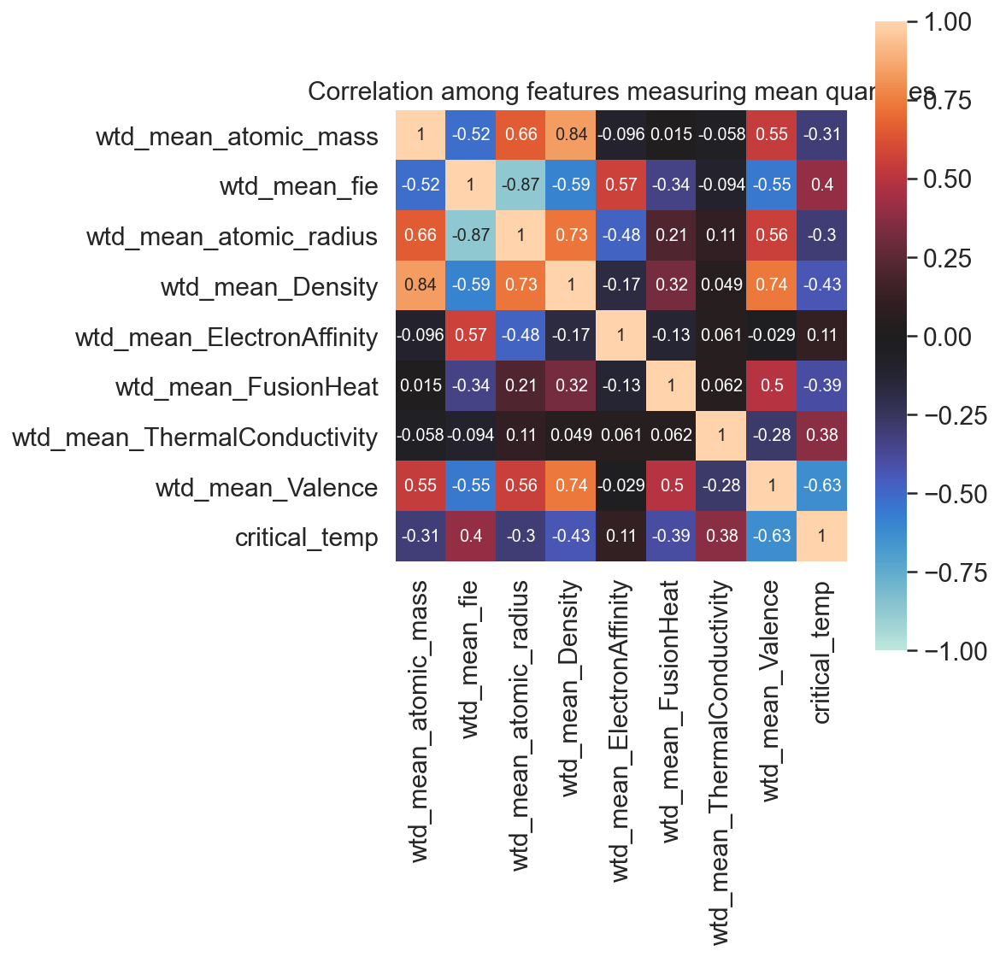

In [21]:
mean_cols = [x for x in data.columns.tolist() if x.startswith('wtd_mean')]
mean_cols += ['critical_temp']
corrdf = data[mean_cols].corr()

fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(corrdf, center=0, vmin=-1, vmax=1, square=True, ax=ax, annot=True)

_ = ax.set_title('Correlation among features measuring mean quantities')

# Which features are the strongest indicators of critical temperature?

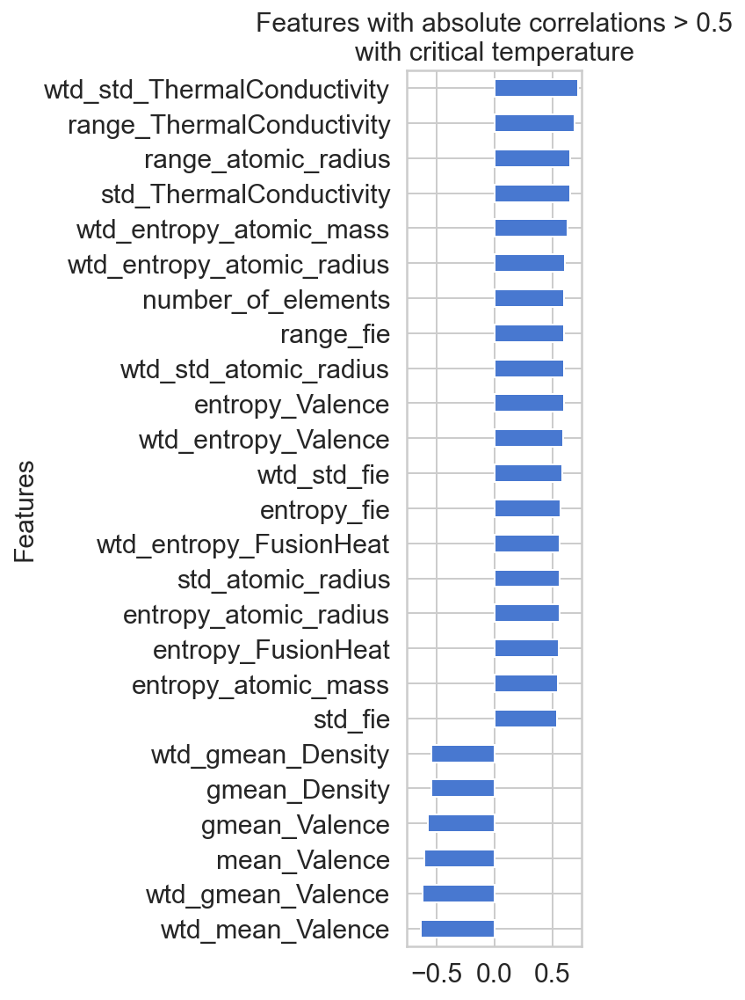

In [22]:
corrdf = (
    data
    .corr()
    .loc['critical_temp']
    .sort_values(ascending=False, 
                 key=lambda x: np.abs(x))
    .reset_index()
    .rename(columns={'index': 'Features', 'critical_temp': 'Correlations'})
    [1:]
)
ax = (
    corrdf
    .loc[lambda x: x['Correlations'].abs() >= 0.5]
    .sort_values(by='Correlations')
    .plot(x='Features', 
          y='Correlations',
          figsize=(5, 8),
          kind='barh', 
          legend=False,
          xlim=(-0.75, 0.75),
          title='Features with absolute correlations > 0.5\nwith critical temperature')
)

# Presence of which elements generally tends to give the highest critical temperatures?

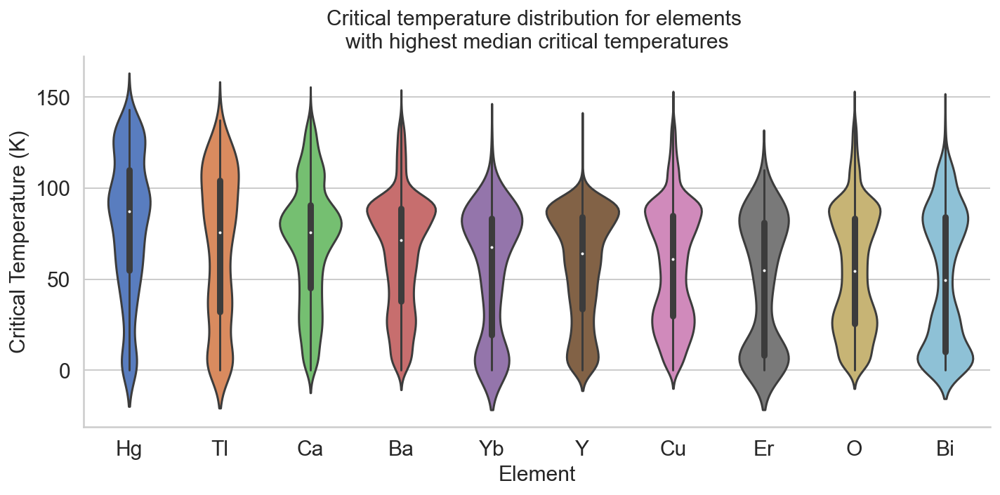

In [23]:
element_cols = datamol.drop(columns=['critical_temp', 'material']).columns.tolist()

presence = (
    datamol
    .melt(id_vars=['critical_temp', 'material'], var_name='element', value_name='present')
    .assign(present = lambda x: x['present'].astype(bool))
    .loc[lambda x: x['present']]
    .drop(columns=['material', 'present'])
)
presence_info = (
    presence
    .groupby(by='element')
    .agg({
        'critical_temp': ['mean', 'median', 'std', 'min', 'max', 'count']
    })
    .sort_values(by=('critical_temp', 'median'), ascending=False)
)
high_temp_elements = presence_info.head(10).index.tolist()
g = sns.catplot(
    x='element', 
    y='critical_temp', 
    data=presence[presence['element'].isin(high_temp_elements)], 
    kind='violin',
    aspect=2,
    order=high_temp_elements,
    palette=sns.color_palette('muted')
)

g.ax.set_xlabel('Element')
g.ax.set_ylabel('Critical Temperature (K)')
_ = g.ax.set_title('Critical temperature distribution for elements \nwith highest median critical temperatures')

In [26]:
features = data.drop(columns=['critical_temp']).columns.tolist()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

X = data[features]
y = data['critical_temp']

X = StandardScaler().fit_transform(X)
model_types = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(n_jobs=1),
    'SVM': SVR(),
    'XGB': XGBRegressor(n_jobs=1)
}

grid_search_params = {
    'Linear Regression': {},
    'Random Forest': {
        'n_estimators': [100, 200, 300],
        'max_depth': [11, 15, 19, 23]
    },
    'SVM': {
        'C': [50, 100, 200, 400],
        'kernel': ['linear', 'rbf']
    },
    'XGB': {
        'n_estimators': [100, 200, 400, 700, 1000],
        'max_depth': [2, 4, 7]
    }
}
def get_parameter_description(params):
    s = ''
    for param, value in params.items():
        s += f'{param}: {value} | '
    return s[:-3]

In [ ]:

result_fields = {
    'model_type',
    'parameters',
    'rmse'
}

best_models = {}

result_dict = {field: [] for field in result_fields}

for model_type in model_types:
    params = grid_search_params[model_type]
#     n_jobs = 28 if model_type == 'XGB' else -1
    gs_model = GridSearchCV(model_types[model_type], 
                            params, 
                            n_jobs=-1,
                            cv=3,
                            scoring='neg_root_mean_squared_error', 
                            verbose=1)
    gs_model.fit(X_train, y_train)
    
    model_results = gs_model.cv_results_
    result_dict['model_type'].extend([model_type] * len(model_results['mean_test_score']))
    result_dict['parameters'].extend([get_parameter_description(x) for x in model_results['params']])
    result_dict['rmse'].extend(model_results['mean_test_score'])
    
    best_models[model_type] = gs_model.best_estimator_

In [ ]:
results = (
    pd.DataFrame(result_dict)
    .assign(rmse = lambda x: -1 * x['rmse'])
    [['model_type', 'parameters', 'rmse']]
results.groupby(by='model_type').agg({'rmse': 'min'})

In [ ]:
results

In [ ]:
results.to_csv('results.csv', index=False)